In [1]:
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
data=pd.read_excel('/content/World_development_mesurement (1).xlsx')
data

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4%,NaN,United States,5.0,4.0,2132446.0,"$16,244,600,000,000",0.179,"$8,895",...,76.0,1.0,1,0.196,0.667,0.136,313873685,0.811,"$200,092,000,000","$126,573,000,000"
2701,0.015,41.9%,NaN,Uruguay,7.0,85.0,NaN,"$50,004,354,667",0.089,"$1,308",...,74.0,1.5,1,0.220,0.639,0.140,3395253,0.948,"$2,222,000,000","$1,028,000,000"
2702,0.020,61.9%,NaN,"Venezuela, RB",144.0,180.0,NaN,"$381,286,223,859",0.046,$593,...,72.0,1.0,1,0.288,0.652,0.060,29954782,0.889,"$904,000,000","$3,202,000,000"


In [3]:
data.describe()

,Birth Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,Health Exp % GDP,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban
count,2585.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2395.000000,1416.000000,2444.000000,2531.000000,1880.000000,2568.000000,2568.000000,2537.000000,2704.0,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000
mean,0.022715,1.423071e+05,39.999418,94.875676,7.723684e+04,0.064170,302.068503,0.032813,0.239747,0.148103,71.159268,66.461838,0.578124,1.0,0.303051,0.623481,0.073465,3.145729e+07,0.562953
std,0.011338,6.159288e+05,57.318588,54.791906,2.599239e+05,0.026325,273.299686,0.029968,0.260132,0.171829,10.708262,9.390217,0.474647,0.0,0.106577,0.069660,0.049541,1.242894e+08,0.245897
min,0.007000,7.000000e+00,1.000000,1.000000,8.000000e+00,0.008000,12.000000,0.002000,0.000000,0.005000,39.000000,37.000000,0.000000,1.0,0.118000,0.474000,0.003000,1.887600e+04,0.082000
25%,0.013000,1.360000e+03,13.000000,48.000000,3.737000e+03,0.046000,156.000000,0.009000,0.000000,0.080000,64.000000,61.000000,0.100000,1.0,0.204750,0.559000,0.033000,8.783360e+05,0.356000
50%,0.020000,8.529000e+03,26.000000,94.000000,1.433800e+04,0.061000,239.000000,0.020000,0.100000,0.120000,75.000000,69.000000,0.500000,1.0,0.299500,0.642500,0.052000,5.800324e+06,0.560000
75%,0.031000,5.910800e+04,45.000000,142.000000,4.185200e+04,0.079000,344.750000,0.053000,0.400000,0.173000,79.000000,73.250000,0.900000,1.0,0.402000,0.676000,0.112000,2.014089e+07,0.765000
max,0.053000,8.286892e+06,694.000000,189.000000,2.727728e+06,0.225000,2600.000000,0.141000,1.000000,4.965000,87.000000,88.000000,2.900000,1.0,0.500000,0.858000,0.244000,1.350695e+09,1.000000


In [4]:
data.shape

(2704, 25)

In [5]:
data.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"


In [6]:
data.tail()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4%,NaN,United States,5.0,4.0,2132446.0,"$16,244,600,000,000",0.179,"$8,895",...,76.0,1.0,1,0.196,0.667,0.136,313873685,0.811,"$200,092,000,000","$126,573,000,000"
2701,0.015,41.9%,NaN,Uruguay,7.0,85.0,NaN,"$50,004,354,667",0.089,"$1,308",...,74.0,1.5,1,0.220,0.639,0.140,3395253,0.948,"$2,222,000,000","$1,028,000,000"
2702,0.020,61.9%,NaN,"Venezuela, RB",144.0,180.0,NaN,"$381,286,223,859",0.046,$593,...,72.0,1.0,1,0.288,0.652,0.060,29954782,0.889,"$904,000,000","$3,202,000,000"
2703,0.011,NaN,NaN,Virgin Islands (U.S.),NaN,NaN,NaN,NaN,NaN,NaN,...,76.0,NaN,1,0.206,0.641,0.152,105275,0.949,NaN,NaN


In [7]:
# Descriptive Statistics
# Get descriptive statistics to understand data distribution for numerical columns.
data.describe()

,Birth Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,Health Exp % GDP,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban
count,2585.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2395.000000,1416.000000,2444.000000,2531.000000,1880.000000,2568.000000,2568.000000,2537.000000,2704.0,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000
mean,0.022715,1.423071e+05,39.999418,94.875676,7.723684e+04,0.064170,302.068503,0.032813,0.239747,0.148103,71.159268,66.461838,0.578124,1.0,0.303051,0.623481,0.073465,3.145729e+07,0.562953
std,0.011338,6.159288e+05,57.318588,54.791906,2.599239e+05,0.026325,273.299686,0.029968,0.260132,0.171829,10.708262,9.390217,0.474647,0.0,0.106577,0.069660,0.049541,1.242894e+08,0.245897
min,0.007000,7.000000e+00,1.000000,1.000000,8.000000e+00,0.008000,12.000000,0.002000,0.000000,0.005000,39.000000,37.000000,0.000000,1.0,0.118000,0.474000,0.003000,1.887600e+04,0.082000
25%,0.013000,1.360000e+03,13.000000,48.000000,3.737000e+03,0.046000,156.000000,0.009000,0.000000,0.080000,64.000000,61.000000,0.100000,1.0,0.204750,0.559000,0.033000,8.783360e+05,0.356000
50%,0.020000,8.529000e+03,26.000000,94.000000,1.433800e+04,0.061000,239.000000,0.020000,0.100000,0.120000,75.000000,69.000000,0.500000,1.0,0.299500,0.642500,0.052000,5.800324e+06,0.560000
75%,0.031000,5.910800e+04,45.000000,142.000000,4.185200e+04,0.079000,344.750000,0.053000,0.400000,0.173000,79.000000,73.250000,0.900000,1.0,0.402000,0.676000,0.112000,2.014089e+07,0.765000
max,0.053000,8.286892e+06,694.000000,189.000000,2.727728e+06,0.225000,2600.000000,0.141000,1.000000,4.965000,87.000000,88.000000,2.900000,1.0,0.500000,0.858000,0.244000,1.350695e+09,1.000000


In [8]:
data.describe(include='object')

,Business Tax Rate,Country,GDP,Health Exp/Capita,Tourism Inbound,Tourism Outbound
count,1423,2704,2494,2395,2336,2233
unique,447,208,2494,1069,1650,1457
top,44.1%,Algeria,"$54,790,058,957",$15,"$80,000,000","$8,000,000"
freq,20,13,1,27,9,19


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

In [10]:
data.dtypes

,0
Birth Rate,float64
Business Tax Rate,object
CO2 Emissions,float64
Country,object
Days to Start Business,float64
Ease of Business,float64
Energy Usage,float64
GDP,object
Health Exp % GDP,float64
Health Exp/Capita,object


In [11]:
data['Business Tax Rate'] = data['Business Tax Rate'].str.rstrip('%').astype(float) / 100

In [12]:
data['GDP'] = data['GDP'].str.replace('\n', '', regex=False).str.replace(',', '', regex=False).str.replace('$', '', regex=False).astype(float)
#The line above was modified to include removal of the dollar sign before conversion to floa

In [13]:
data['Health Exp/Capita'] = data['Health Exp/Capita'].str.replace('\n', '',regex=False).str.replace(',','', regex=False).str.replace('$','', regex=False).astype(float)

In [14]:
 data['Tourism Inbound'] = data['Tourism Inbound'].str.replace('\n','', regex=False). str.replace(',','',regex=False).str.replace('$','',regex=False).astype(float)

In [15]:
data['Tourism Outbound'] = data['Tourism Outbound'].str.replace('\n','', regex=False).str.replace(',','',regex=False).str.replace('$','',regex=False).astype(float)

In [16]:
data.dtypes

,0
Birth Rate,float64
Business Tax Rate,float64
CO2 Emissions,float64
Country,object
Days to Start Business,float64
Ease of Business,float64
Energy Usage,float64
GDP,float64
Health Exp % GDP,float64
Health Exp/Capita,float64


In [17]:
data.duplicated()
# If duplicate values are there your model will not learn any new thing from it

,0
0,False
1,False
2,False
3,False
4,False
...,...
2699,False
2700,False
2701,False
2702,False


In [18]:
data[data.duplicated(keep=False)] # checking the duplicated values

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound


In [19]:
data.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,5.479006e+10,0.035,60.0,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,102000000.0,193000000.0
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,9.129595e+09,0.034,22.0,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,34000000.0,146000000.0
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,2.359122e+09,0.043,15.0,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,77000000.0,50000000.0
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,5.788312e+09,0.047,152.0,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,227000000.0,209000000.0
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,2.610959e+09,0.051,12.0,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,23000000.0,30000000.0


In [20]:
data.isna() # or isnull(), True: missing value

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,False,True,False,False,True,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,True,False,False,True,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,True,False,False,True,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,True,False,False,True,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,True,False,False,True,True,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,True,True,True,False,True,True,True,True,True,True,...,True,True,False,True,True,True,False,False,True,True
2700,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2701,False,False,True,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2702,False,False,True,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [21]:
data.isna().sum()

,0
Birth Rate,119
Business Tax Rate,1281
CO2 Emissions,579
Country,0
Days to Start Business,986
Ease of Business,2519
Energy Usage,919
GDP,210
Health Exp % GDP,309
Health Exp/Capita,309


<Axes: >

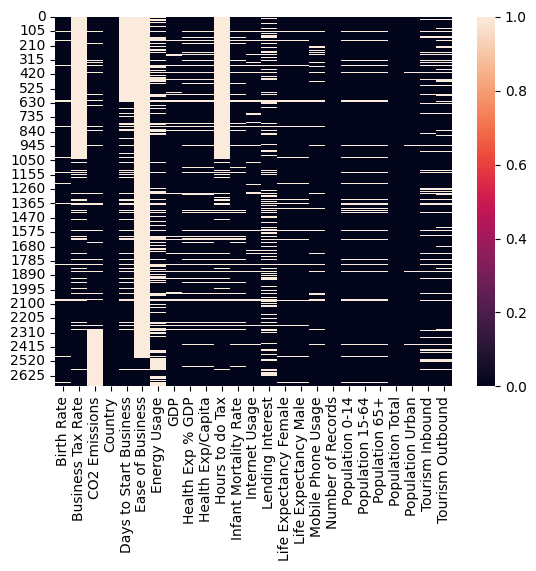

In [22]:
# visualize missing values
sns.heatmap(data.isna()) # white horizantal lines are missing values

In [23]:
 data.isna().sum()

,0
Birth Rate,119
Business Tax Rate,1281
CO2 Emissions,579
Country,0
Days to Start Business,986
Ease of Business,2519
Energy Usage,919
GDP,210
Health Exp % GDP,309
Health Exp/Capita,309


In [24]:
len(data)

2704

In [25]:
# % of missing values to decide replace missing values or drop columns as per % of missing values
for i in data.isna().sum():
  print(i/len(data*100))

0.04400887573964497
0.47374260355029585
0.21412721893491124
0.0
0.3646449704142012
0.9315828402366864
0.33986686390532544
0.07766272189349112
0.11427514792899408
0.11427514792899408
0.47633136094674555
0.09615384615384616
0.0639792899408284
0.3047337278106509
0.05029585798816568
0.05029585798816568
0.0617603550295858
0.0
0.08136094674556213
0.08136094674556213
0.08136094674556213
0.0
0.009615384615384616
0.13609467455621302
0.17418639053254437


In [26]:
data.drop('Ease of Business', axis=1, inplace=True)

In [27]:
data

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,26998.0,5.479006e+10,0.035,60.0,NaN,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,1.020000e+08,1.930000e+08
1,0.050,NaN,9542.0,Angola,NaN,7499.0,9.129595e+09,0.034,22.0,NaN,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,3.400000e+07,1.460000e+08
2,0.043,NaN,1617.0,Benin,NaN,1983.0,2.359122e+09,0.043,15.0,NaN,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,7.700000e+07,5.000000e+07
3,0.027,NaN,4276.0,Botswana,NaN,1836.0,5.788312e+09,0.047,152.0,NaN,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,2.270000e+08,2.090000e+08
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,2.610959e+09,0.051,12.0,NaN,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,2.300000e+07,3.000000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,0.464,NaN,United States,5.0,2132446.0,1.624460e+13,0.179,8895.0,175.0,...,76.0,1.0,1,0.196,0.667,0.136,313873685,0.811,2.000920e+11,1.265730e+11
2701,0.015,0.419,NaN,Uruguay,7.0,NaN,5.000435e+10,0.089,1308.0,310.0,...,74.0,1.5,1,0.220,0.639,0.140,3395253,0.948,2.222000e+09,1.028000e+09
2702,0.020,0.619,NaN,"Venezuela, RB",144.0,NaN,3.812862e+11,0.046,593.0,792.0,...,72.0,1.0,1,0.288,0.652,0.060,29954782,0.889,9.040000e+08,3.202000e+09


In [28]:
# Fill numeric columns with mean and categorical columns with mode
for column in data.columns:
    if data[column].dtype == 'float64' or data[column].dtype == 'int64':
        data[column].fillna(data[column].mean(), inplace=True)
    else:
        data[column].fillna(data[column].mode()[0], inplace=True)


<ipython-input-28-b5307c528910>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[column].fillna(data[column].mean(), inplace=True)
<ipython-input-28-b5307c528910>:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', tr

In [29]:
data

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020000,0.489669,87931.000000,Algeria,39.999418,2.699800e+04,5.479006e+10,0.03500,60.000000,302.068503,...,67.000000,0.000000,1,0.342000,0.619000,0.039000,31719449,0.599,1.020000e+08,1.930000e+08
1,0.050000,0.489669,9542.000000,Angola,39.999418,7.499000e+03,9.129595e+09,0.03400,22.000000,302.068503,...,44.000000,0.000000,1,0.476000,0.499000,0.025000,13924930,0.324,3.400000e+07,1.460000e+08
2,0.043000,0.489669,1617.000000,Benin,39.999418,1.983000e+03,2.359122e+09,0.04300,15.000000,302.068503,...,53.000000,0.000000,1,0.454000,0.517000,0.029000,6949366,0.383,7.700000e+07,5.000000e+07
3,0.027000,0.489669,4276.000000,Botswana,39.999418,1.836000e+03,5.788312e+09,0.04700,152.000000,302.068503,...,49.000000,0.100000,1,0.383000,0.587000,0.029000,1755375,0.532,2.270000e+08,2.090000e+08
4,0.046000,0.489669,1041.000000,Burkina Faso,39.999418,7.723684e+04,2.610959e+09,0.05100,12.000000,302.068503,...,49.000000,0.000000,1,0.468000,0.505000,0.028000,11607944,0.178,2.300000e+07,3.000000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.022715,0.489669,142307.107765,Turks and Caicos Islands,39.999418,7.723684e+04,2.638540e+11,0.06417,801.397077,302.068503,...,66.461838,0.578124,1,0.303051,0.623481,0.073465,32427,0.911,4.939320e+09,4.729435e+09
2700,0.013000,0.464000,142307.107765,United States,5.000000,2.132446e+06,1.624460e+13,0.17900,8895.000000,175.000000,...,76.000000,1.000000,1,0.196000,0.667000,0.136000,313873685,0.811,2.000920e+11,1.265730e+11
2701,0.015000,0.419000,142307.107765,Uruguay,7.000000,7.723684e+04,5.000435e+10,0.08900,1308.000000,310.000000,...,74.000000,1.500000,1,0.220000,0.639000,0.140000,3395253,0.948,2.222000e+09,1.028000e+09
2702,0.020000,0.619000,142307.107765,"Venezuela, RB",144.000000,7.723684e+04,3.812862e+11,0.04600,593.000000,792.000000,...,72.000000,1.000000,1,0.288000,0.652000,0.060000,29954782,0.889,9.040000e+08,3.202000e+09


In [30]:
data.dtypes

,0
Birth Rate,float64
Business Tax Rate,float64
CO2 Emissions,float64
Country,object
Days to Start Business,float64
Energy Usage,float64
GDP,float64
Health Exp % GDP,float64
Health Exp/Capita,float64
Hours to do Tax,float64


In [31]:
data.isna().sum()

,0
Birth Rate,0
Business Tax Rate,0
CO2 Emissions,0
Country,0
Days to Start Business,0
Energy Usage,0
GDP,0
Health Exp % GDP,0
Health Exp/Capita,0
Hours to do Tax,0


<Axes: >

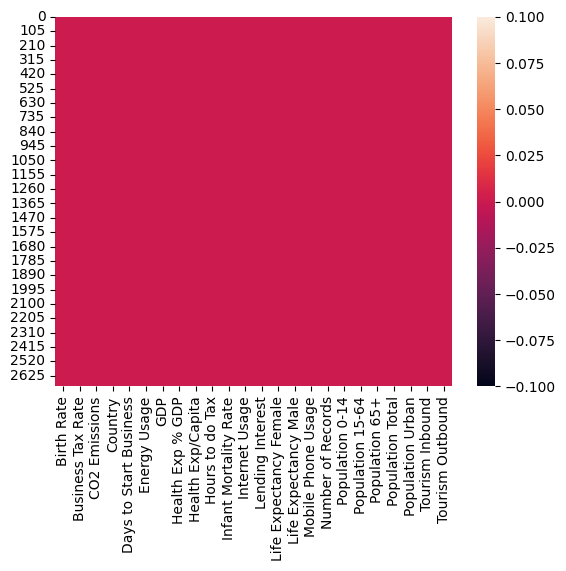

In [32]:
# visualize missing values
sns.heatmap(data.isna()) # white horizantal lines are missing values

In [33]:
#Unique Values
# Check the number of unique values in each column to understand categorical or numerical variables.
for col in data.columns:
    print(f"{col}: {data[col].nunique()} unique values")

Birth Rate: 48 unique values
Business Tax Rate: 448 unique values
CO2 Emissions: 1744 unique values
Country: 208 unique values
Days to Start Business: 127 unique values
Energy Usage: 1722 unique values
GDP: 2495 unique values
Health Exp % GDP: 146 unique values
Health Exp/Capita: 1070 unique values
Hours to do Tax: 281 unique values
Infant Mortality Rate: 130 unique values
Internet Usage: 12 unique values
Lending Interest: 352 unique values
Life Expectancy Female: 50 unique values
Life Expectancy Male: 48 unique values
Mobile Phone Usage: 27 unique values
Number of Records: 1 unique values
Population 0-14: 377 unique values
Population 15-64: 299 unique values
Population 65+: 209 unique values
Population Total: 2699 unique values
Population Urban: 823 unique values
Tourism Inbound: 1651 unique values
Tourism Outbound: 1458 unique values


In [34]:
#Correlation Analysis
# Analyze correlations between numerical variables to find relationships.

# Select only numerical columns for correlation analysis
numerical_data = data.select_dtypes(include=['number'])

# Calculate the correlation matrix
correlation_matrix = numerical_data.corr()

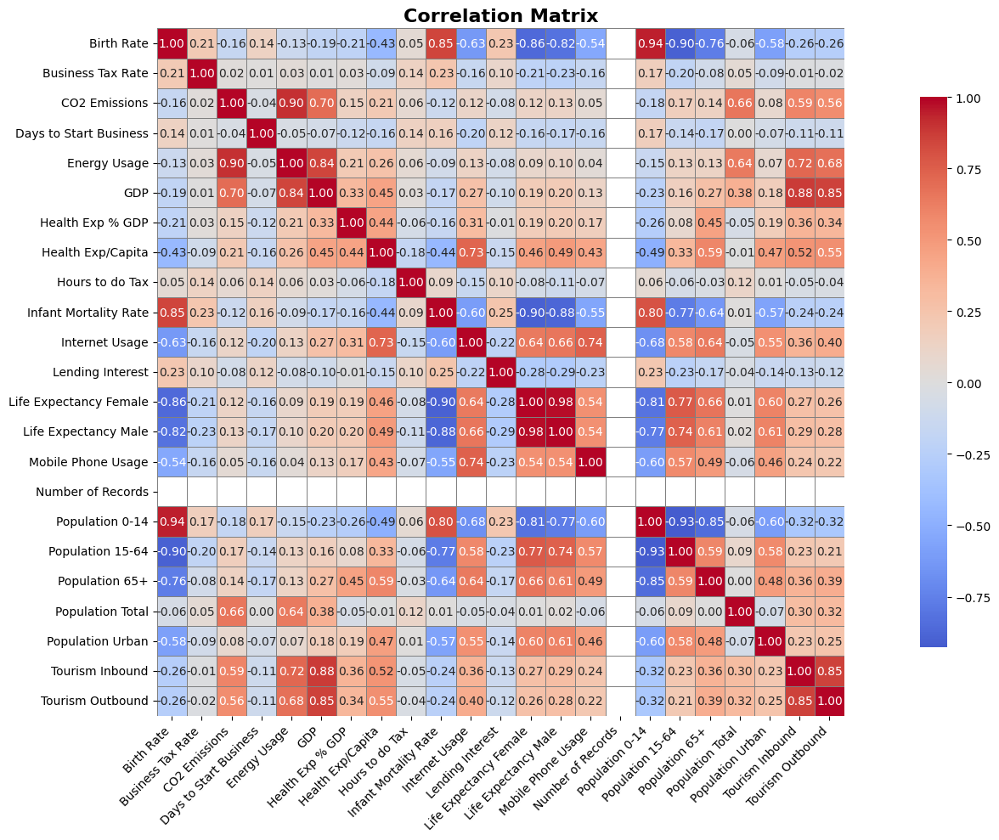

In [35]:
plt.figure(figsize=(18, 10))
sns.heatmap(correlation_matrix,
    annot=True,            # Shows the correlation values in each cell
    fmt=".2f",             # Formats correlation values to 2 decimal places
    cmap='coolwarm',       # Color palette for positive/negative correlations
    center=0,              # Centers the color map at zero, making positive/negative distinctions clearer
    linewidths=0.5,        #for readability
    linecolor='gray',
    square=True,
    cbar_kws={"shrink": 0.8}  # Shrinks the color bar to fit better
)
plt.title('Correlation Matrix',fontsize=16, weight='bold')
plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate x-axis labels
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

# Detect and Treat outlires

1.Histogram

2.Boxplot

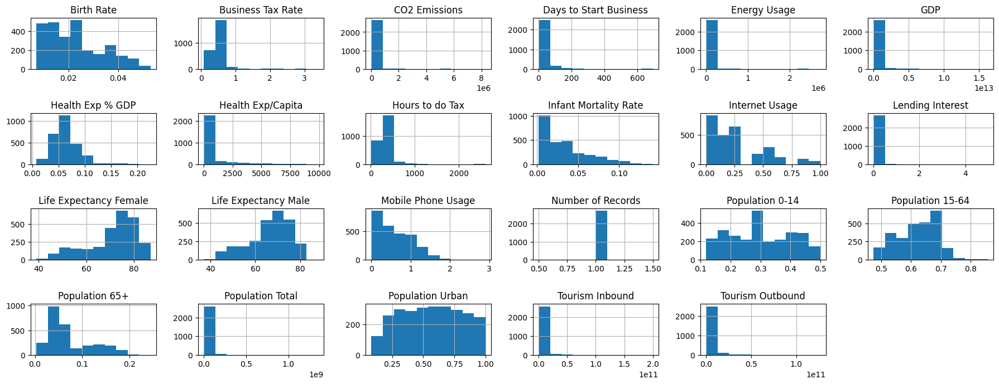

In [36]:
data.hist(bins=10, figsize=(18, 10), layout=(6,6))
plt.tight_layout()
plt.show()

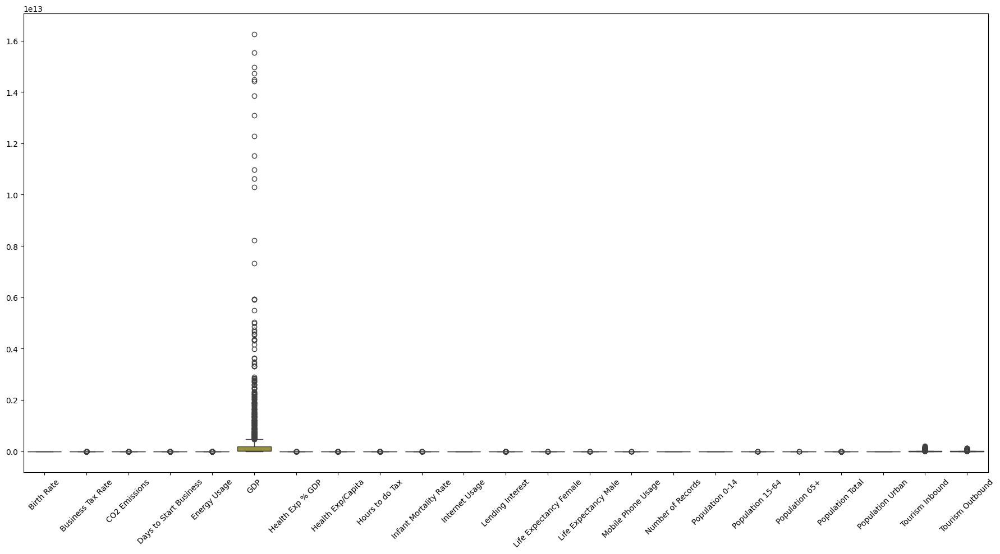

In [37]:
plt.figure(figsize=(18, 10))  # Increase width as needed
sns.boxplot(data=data)
plt.xticks(rotation=45)  # Rotate labels
plt.tight_layout()
plt.show()

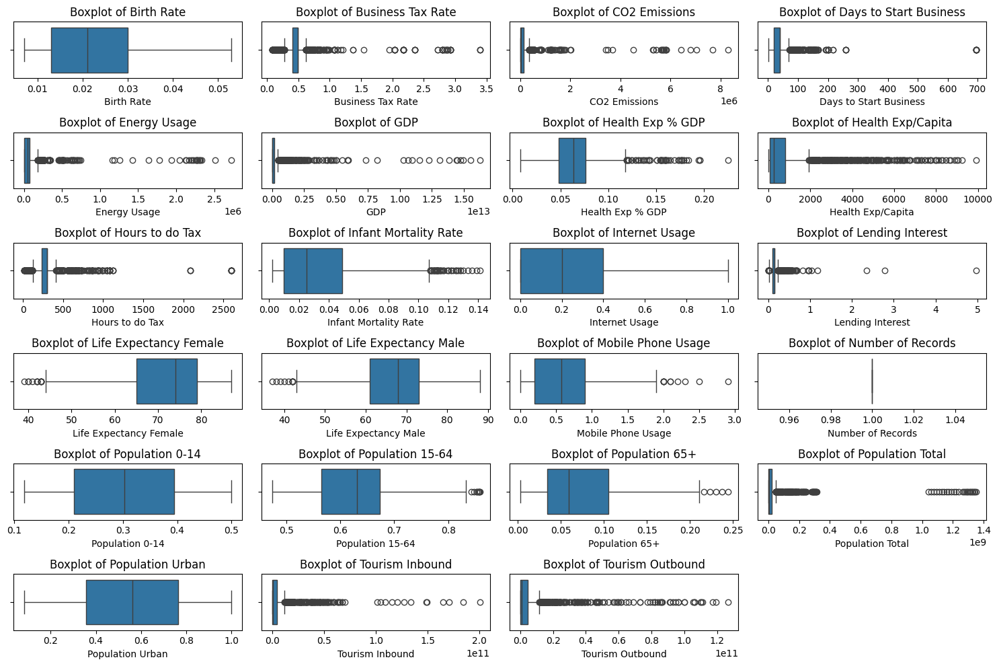

In [38]:
# Loop through numeric columns and create boxplots
numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns

# Calculate the number of rows and columns for the subplot grid
num_cols = len(numeric_cols)
num_rows = (num_cols + 3) // 4  # Calculate rows, ensuring at least one row

plt.figure(figsize=(15, 10))
for i, column in enumerate(numeric_cols, 1):
    # Create subplot, dynamically adjusting the grid size
    plt.subplot(num_rows, 4, i)
    sns.boxplot(x=data[column])
    plt.title(f'Boxplot of {column}')

plt.tight_layout()
plt.show()

In [39]:
import pandas as pd

# Function to replace outliers based on IQR method
def replace_outliers_iqr(df, column):
    # Calculate Q1 (25th percentile) and Q3 (75th percentile)
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    # Define lower and upper bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Replace values below the lower bound with Q1 and above the upper bound with Q3
    df[column] = df[column].apply(lambda x: lower_bound if x < lower_bound else upper_bound if x > upper_bound else x)

# Example usage: Replace outliers in each numeric column
for col in data.select_dtypes(include=['float64', 'int64']).columns:
    replace_outliers_iqr(data, col)

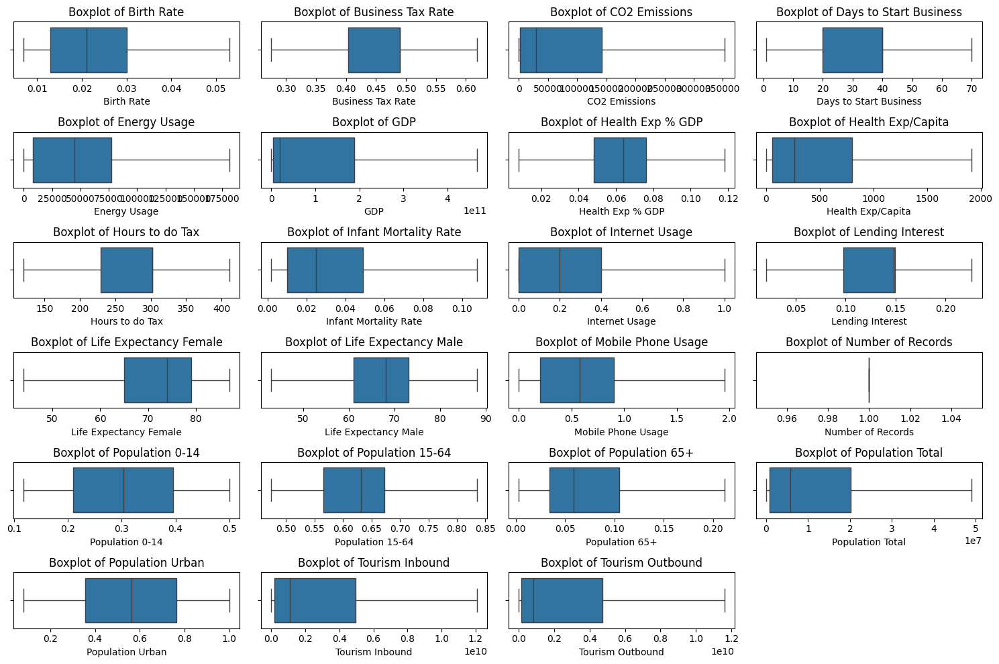

In [40]:
# Loop through numeric columns and create boxplots
numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns

# Calculate the number of rows and columns for the subplot grid
num_cols = len(numeric_cols)
num_rows = (num_cols + 3) // 4  # Calculate rows, ensuring at least one row

plt.figure(figsize=(15, 10))
for i, column in enumerate(numeric_cols, 1):
    # Create subplot, dynamically adjusting the grid size
    plt.subplot(num_rows, 4, i)
    sns.boxplot(x=data[column])
    plt.title(f'Boxplot of {column}')

plt.tight_layout()
plt.show()


## Data Visualization


In [41]:
# Histogram

In [42]:
import warnings
warnings.filterwarnings("ignore")

<function matplotlib.pyplot.show(close=None, block=None)>

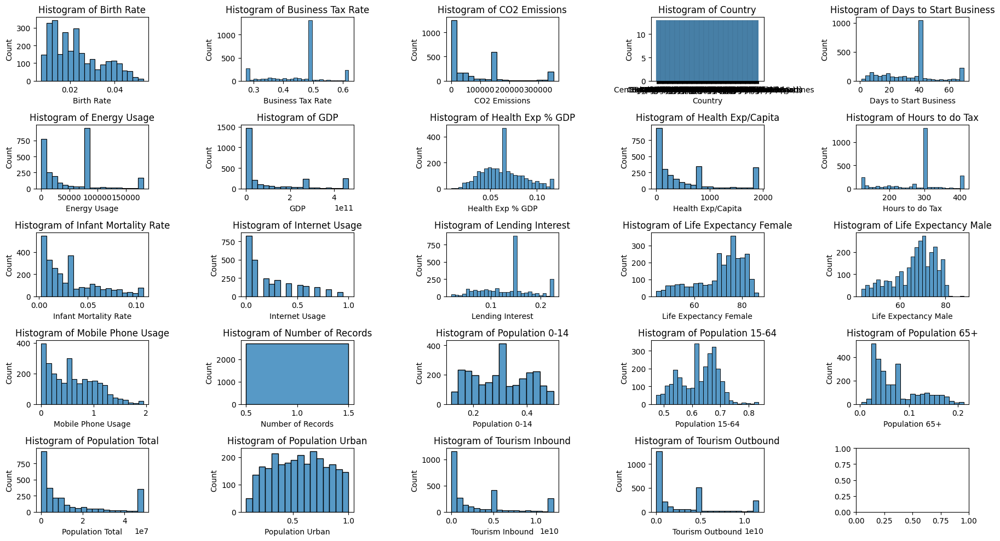

In [43]:
fig, axes = plt.subplots(nrows = 5, ncols= 5,figsize=(18,10))
axes= axes.flatten()

for i, col in enumerate(data.columns):
    # Change i*1 to i % len(axes) to ensure the index wraps around
    sns.histplot(data[col], kde=False, ax=axes[i % len(axes)])
    axes[i % len(axes)].set_title(f'Histogram of {col}')

plt.tight_layout()
plt.show

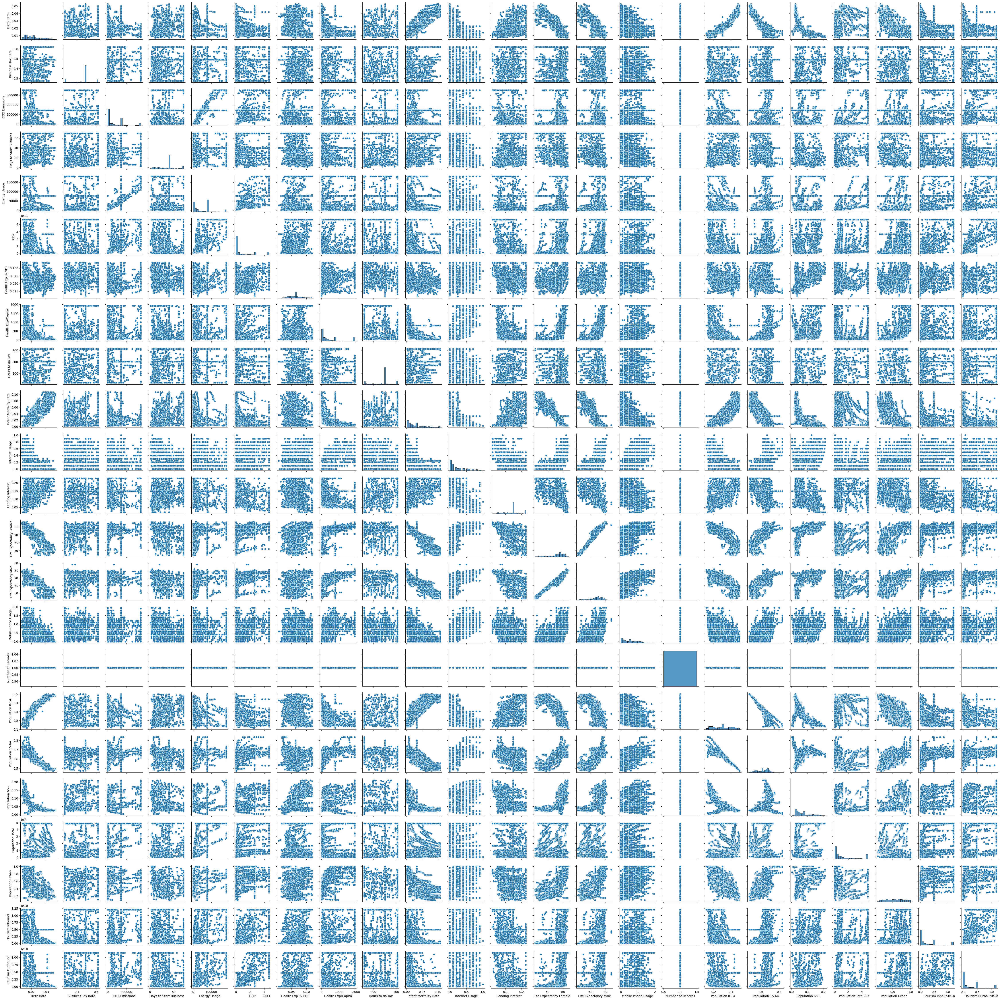

In [44]:
#Pair plot for deeper insights
sns.pairplot(data=data, height=2, aspect=1)

In [45]:
# Feature Scaling
scaler = StandardScaler()
scaled_features = scaler.fit_transform(data.select_dtypes(include=[np.number]))

In [46]:
# Update the DataFrame with scaled features
data_scaled = pd.DataFrame(scaled_features,columns=data.select_dtypes(include=[np.number]).columns)

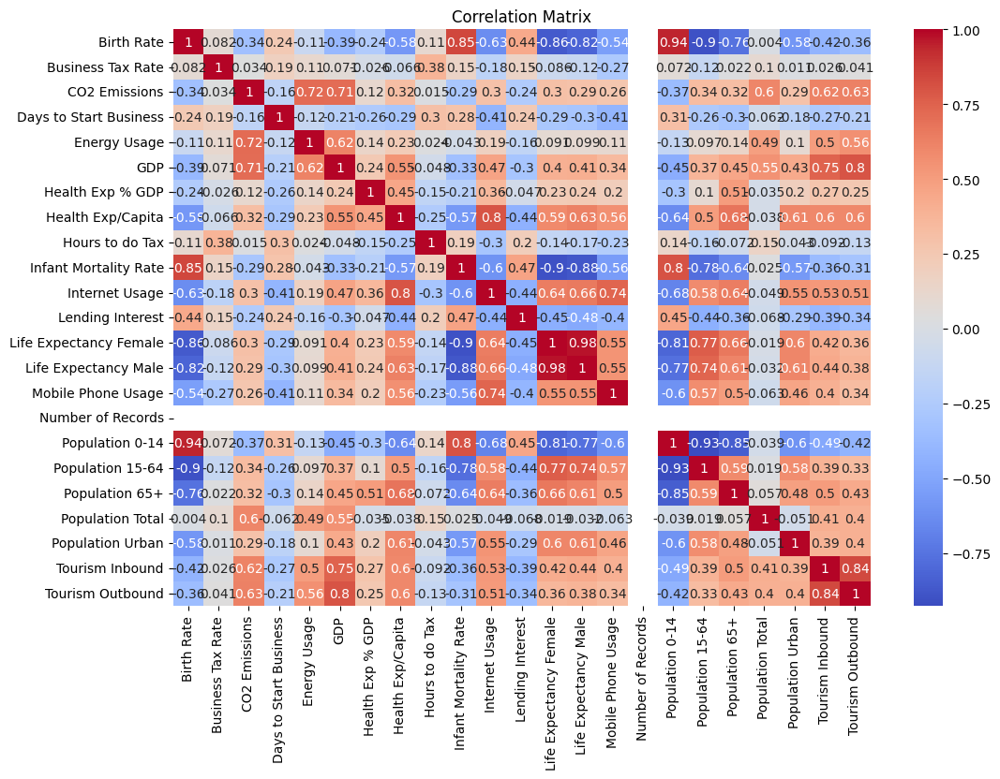

In [47]:
# Plotting correlation matrix
plt.figure(figsize=(12,8))
sns.heatmap(data_scaled.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

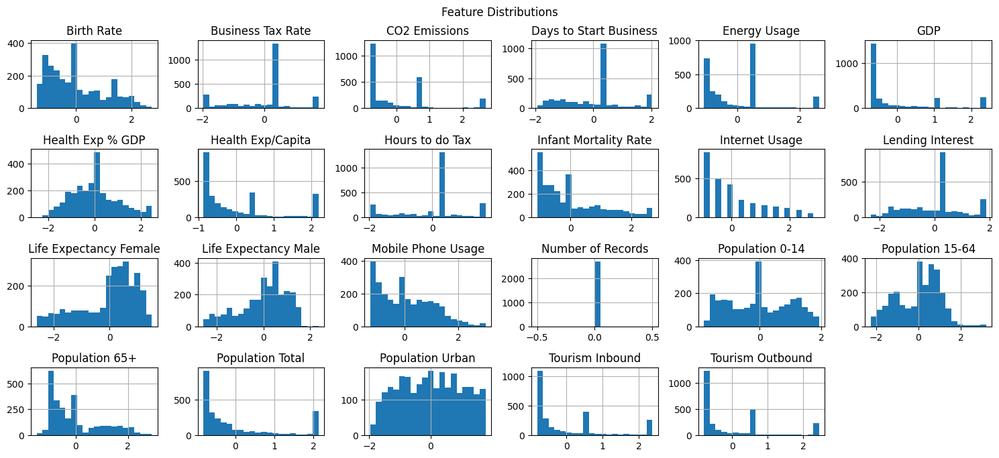

In [48]:
# Visualizing feature distributions
data_scaled.hist(bins=20, figsize=(15, 10), layout=(6,6))
plt.suptitle('Feature Distributions')
plt.tight_layout()
plt.show()

# Implementing Clustering Algorithms:

In [49]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

In [50]:
# K-Means Clustering
inertia = []
silhouette_scores = []

for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_scaled)
    inertia.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(data_scaled, kmeans.labels_))

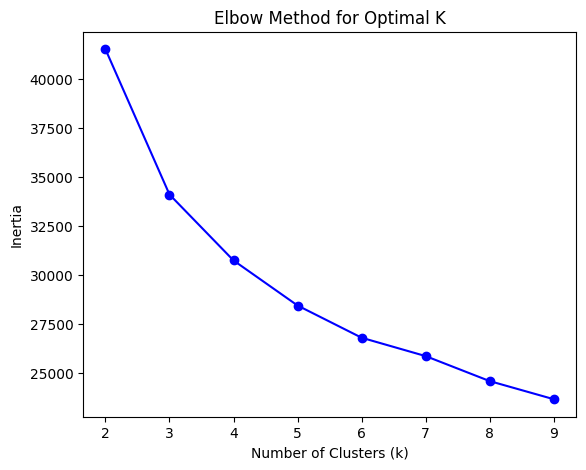

In [51]:
# Plot Elbow Method and Silhouette Score
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(range(2, 10), inertia, 'bo-', label='Inertia')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()

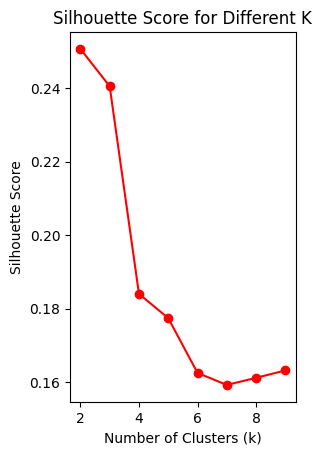

In [52]:
plt.subplot(1, 2, 2)
plt.plot(range(2, 10), silhouette_scores, 'ro-', label='Silhouette Score')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different K')
plt.show()

In [53]:
# Best K-Means clustering based on Silhouette Score
best_k = silhouette_scores.index(max(silhouette_scores)) + 2
kmeans = KMeans(n_clusters=best_k, random_state=42)
kmeans.fit(data_scaled)
kmeans_labels = kmeans.labels_

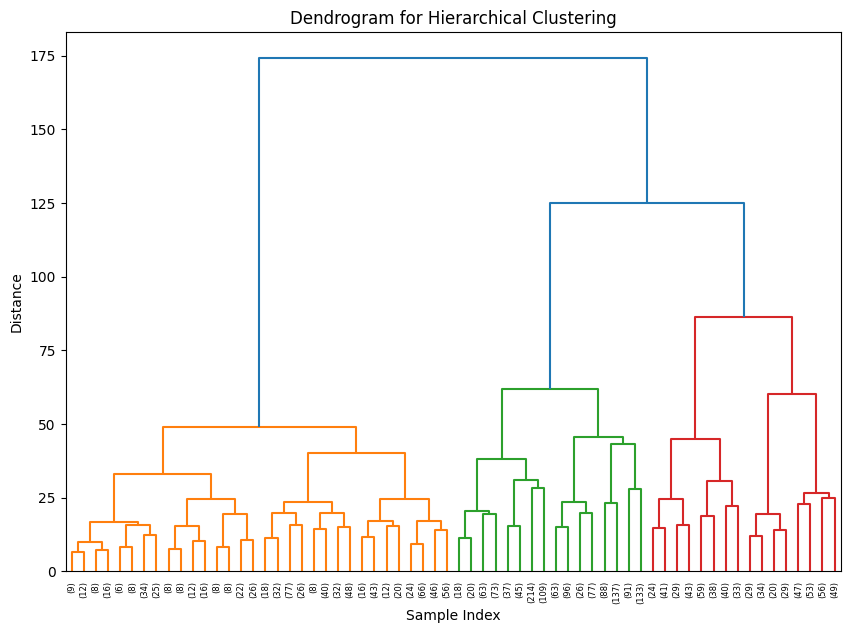

In [54]:
from scipy.cluster.hierarchy import dendrogram, linkage

# Perform hierarchical clustering
Z = linkage(data_scaled, method='ward')  # 'ward' is popular for Euclidean distance

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z, truncate_mode='level', p=5)  # Truncate for readability if needed
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

In [55]:
# Assign clusters
hierarchical_labels = fcluster(Z, t=best_k, criterion='maxclust')

In [56]:
# DBSCAN Clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(data_scaled)

In [57]:
# Evaluate DBSCAN with silhouette score
dbscan_silhouette = silhouette_score(data_scaled, dbscan_labels)
print(f'DBSCAN Silhouette Score: {dbscan_silhouette:.4f}')

DBSCAN Silhouette Score: -0.3436


# Visualization

In [58]:
# Add cluster labels to the dataset
data_scaled['KMeans_Cluster'] = kmeans_labels
data_scaled['Hierarchical_Cluster'] = hierarchical_labels
data_scaled['DBSCAN_Cluster'] = dbscan_labels




In [59]:
print("K-Means Cluster Analysis")
print(data_scaled.groupby('KMeans_Cluster').mean())

K-Means Cluster Analysis
                Birth Rate  Business Tax Rate  CO2 Emissions  \
KMeans_Cluster                                                 
0                 0.824497           0.061174      -0.425021   
1                -0.706712          -0.052435       0.364304   

                Days to Start Business  Energy Usage       GDP  \
KMeans_Cluster                                                   
0                             0.329258     -0.243401 -0.517950   
1                            -0.282221      0.208629  0.443957   

                Health Exp % GDP  Health Exp/Capita  Hours to do Tax  \
KMeans_Cluster                                                         
0                      -0.278758          -0.689416         0.115039   
1                       0.238935           0.590928        -0.098605   

                Infant Mortality Rate  ...  Number of Records  \
KMeans_Cluster                         ...                      
0                            0.747

In [60]:
print("\nDBSCAN Cluster Analysis")
print(data_scaled.groupby('DBSCAN_Cluster').mean())


DBSCAN Cluster Analysis
                Birth Rate  Business Tax Rate  CO2 Emissions  \
DBSCAN_Cluster                                                 
-1               -0.016656          -0.033996       0.000627   
 0                2.281230           0.367064      -0.782414   
 1                2.200032           0.367064      -0.782205   
 2                0.000000           0.367064       0.615064   
 3               -0.224890           0.367064       0.615064   
 4                0.000000           0.367064       0.615064   
 5                0.000000           0.367064       0.615064   
 6               -0.508659           0.367064       0.615064   
 7                1.469247           0.367064      -0.708024   
 8               -0.335159           0.367064      -0.683838   
 9                0.025722           0.367064      -0.376513   
 10               0.000000           0.367064       0.615064   
 11               2.678199           0.367064      -0.779524   
 12            

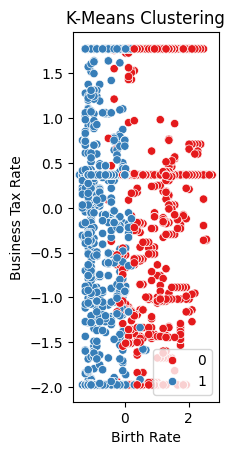

In [61]:
# K-Means Clusters
plt.subplot(1, 3, 1)
sns.scatterplot(x=data_scaled.iloc[:, 0], y=data_scaled.iloc[:, 1], hue=kmeans_labels, palette='Set1')
plt.title('K-Means Clustering')
plt.show()

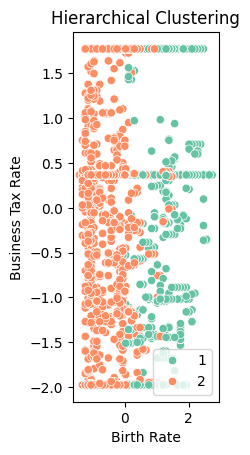

In [62]:
# Hierarchical Clusters    ( Need Change)
plt.subplot(1, 3, 1)
sns.scatterplot(x=data_scaled.iloc[:, 0], y=data_scaled.iloc[:, 1], hue=hierarchical_labels, palette='Set2')
plt.title('Hierarchical Clustering')
plt.show()

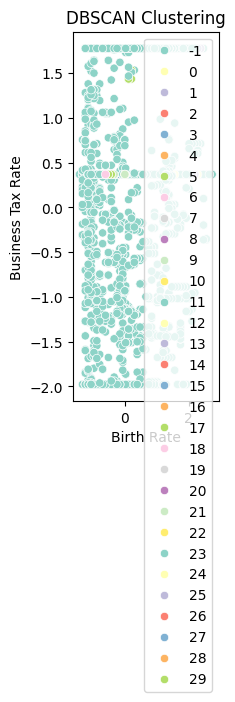

In [63]:
# DBSCAN Clusters
plt.subplot(1, 3, 3)
sns.scatterplot(x=data_scaled.iloc[:, 0], y=data_scaled.iloc[:, 1], hue=dbscan_labels, palette='Set3')
plt.title('DBSCAN Clustering')
plt.show()

# Evaluation

In [64]:
kmeans_silhouette = silhouette_score(data_scaled.iloc[:, :-3], kmeans_labels)
print(f'K-Means Silhouette Score: {kmeans_silhouette:.4f}')

K-Means Silhouette Score: 0.2506


In [65]:
# Evaluate Hierarchical Clustering
hierarchical_silhouette = silhouette_score(data_scaled.iloc[:, :-3], hierarchical_labels)
print(f'Hierarchical Clustering Silhouette Score: {hierarchical_silhouette:.4f}')

Hierarchical Clustering Silhouette Score: 0.2246


In [66]:
from sklearn.mixture import GaussianMixture

gmm = GaussianMixture(n_components=best_k, random_state=0)
gmm_labels = gmm.fit_predict(data_scaled)
print("Silhouette Score for GMM:", silhouette_score(data_scaled, gmm_labels))


Silhouette Score for GMM: 0.2611025510998044


# PCA for Dimensionality Reduction

Sometimes high dimensionality can obscure clusters. Use Principal Component Analysis (PCA) to reduce dimensions and potentially improve clustering performance.

In [67]:
# Tuning KMeans clusters based on Silhouette Score
from sklearn.metrics import silhouette_score
best_score = -1
best_k = 0

for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=0)
    labels = kmeans.fit_predict(data_scaled)
    score = silhouette_score(data_scaled, labels)
    if score > best_score:
        best_score = score
        best_k = k

print(f"Optimal number of clusters for K-Means: {best_k}, Silhouette Score: {best_score}")

Optimal number of clusters for K-Means: 3, Silhouette Score: 0.2677759640519297


In [68]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)

In [69]:
# Then re-run KMeans with the reduced data
kmeans = KMeans(n_clusters=best_k, random_state=0)
kmeans_labels = kmeans.fit_predict(data_pca)
print("Silhouette Score after PCA with KMeans:", silhouette_score(data_pca, kmeans_labels))

Silhouette Score after PCA with KMeans: 0.5622254432739524


In [72]:

import joblib

# Save PCA and KMeans models
joblib.dump(data_pca, 'pca_model.pkl')
joblib.dump(kmeans, 'kmeans_model.pkl')


['kmeans_model.pkl']

In [73]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Sample data
# data = pd.read_csv('your_data.csv')  # Load your dataset here

# Ensure you're working with only numeric columns
numeric_data = data.select_dtypes(include=[np.number])  # Select only numeric columns

# Standardize the data
std = StandardScaler()
data_normal = std.fit_transform(numeric_data)

# Apply PCA
pca = PCA()
pca_components = pca.fit_transform(data_normal)

# Create a DataFrame for PCA components
pca_components_df = pd.DataFrame(pca_components, columns=[f'PC{i+1}' for i in range(pca.n_components_)])

# Now, create a DataFrame for feature contributions
pca_feature_contributions = pd.DataFrame(np.abs(pca.components_), columns=numeric_data.columns)
pca_feature_contributions.index = [f'PC{i+1}' for i in range(pca.n_components_)]

print(pca_feature_contributions)  # This will show the contributions of each original feature


        Birth Rate  Business Tax Rate  CO2 Emissions  Days to Start Business  \
PC1   2.777372e-01       3.652584e-02   1.707710e-01            1.312749e-01   
PC2   1.482199e-01       1.555185e-01   3.738620e-01            2.690273e-02   
PC3   2.148536e-01       4.351838e-01   5.485232e-02            3.771835e-01   
PC4   6.110776e-02       3.923978e-01   1.915267e-01            2.788442e-02   
PC5   1.564114e-01       1.052772e-01   1.381896e-01            4.365633e-01   
PC6   1.048034e-01       4.451127e-01   1.010927e-01            6.656338e-01   
PC7   4.195522e-02       3.059597e-01   1.344748e-01            5.846614e-02   
PC8   1.221034e-02       4.084459e-01   5.106215e-02            2.273337e-01   
PC9   4.261099e-02       7.501203e-03   2.409883e-01            2.575040e-02   
PC10  1.639459e-01       2.661947e-01   1.157803e-01            2.221857e-01   
PC11  4.912727e-02       8.635486e-02   1.086714e-01            1.130520e-01   
PC12  1.499222e-01       2.409300e-01   

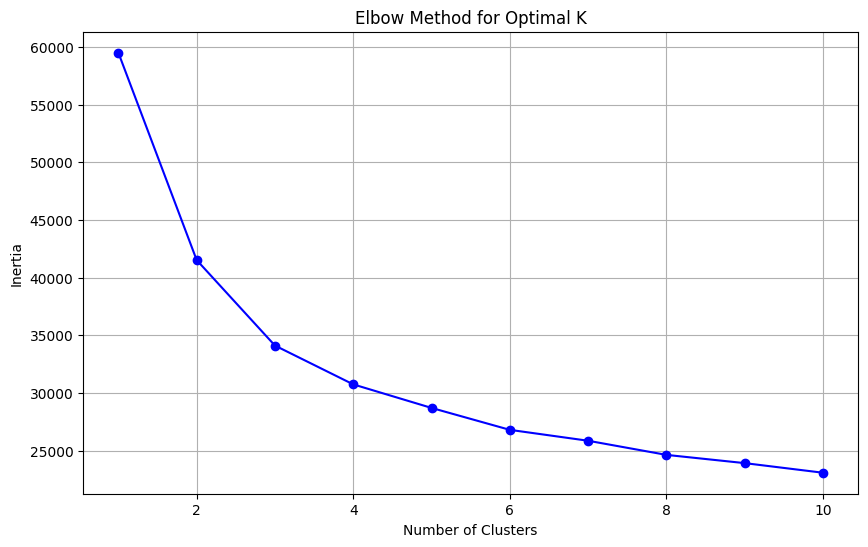

In [74]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Initialize an empty list to store inertia values
inertia = []

# Compute KMeans for a range of k values
k_values = range(1, 11)  # Testing from 1 to 10 clusters
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(pca_components)  # Use the PCA-transformed data
    inertia.append(kmeans.inertia_)

# Plot the Elbow Curve
plt.figure(figsize=(10, 6))
plt.plot(k_values, inertia, 'bo-')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.grid()
plt.show()


In [75]:
# Replace `optimal_k` with the value determined from the Elbow Method
optimal_k = 3  # Example; adjust this based on your elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=0)
kmeans_labels = kmeans.fit_predict(pca_components)


In [76]:
from sklearn.metrics import silhouette_score

# Calculate the silhouette score
silhouette_avg = silhouette_score(pca_components, kmeans_labels)
print(f"Silhouette Score: {silhouette_avg}")


Silhouette Score: 0.24008775424324522


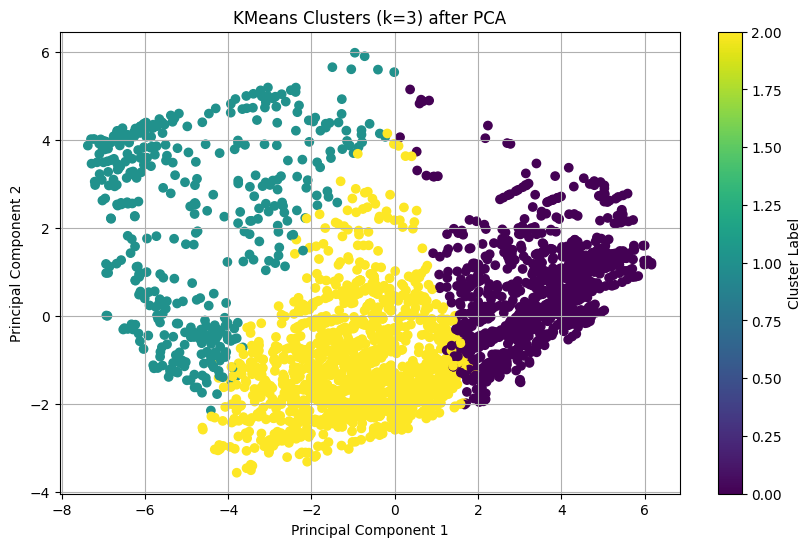

In [77]:
# Scatter plot to visualize clusters
plt.figure(figsize=(10, 6))
plt.scatter(pca_components[:, 0], pca_components[:, 1], c=kmeans_labels, cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title(f'KMeans Clusters (k={optimal_k}) after PCA')
plt.colorbar(label='Cluster Label')
plt.grid()
plt.show()

In [78]:
# Assuming `data` is your original dataset
data['Cluster'] = kmeans_labels


In [79]:
import joblib

# Save PCA and KMeans models
joblib.dump(pca, 'pca_model.pkl')
joblib.dump(kmeans, 'kmeans_model.pkl')


['kmeans_model.pkl']

In [80]:
pip install streamlit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 74.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 75.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.3/79.3 kB 5.7 MB/s eta 0:00:00


In [81]:
import streamlit as st
import joblib
import pandas as pd
import numpy as np

# Load models
pca_model = joblib.load('pca_model.pkl')
kmeans_model = joblib.load('kmeans_model.pkl')

# Streamlit app title
st.title("Clustering Model Deployment")

# Upload CSV file
uploaded_file = st.file_uploader("Choose a CSV file", type="csv")

if uploaded_file is not None:
    # Read the uploaded file
    data = pd.read_csv(uploaded_file)

    # Preprocess data if necessary
    # (e.g., drop non-numeric columns, handle missing values, etc.)

    # Scale the data
    from sklearn.preprocessing import StandardScaler
    std = StandardScaler()
    data_normal = std.fit_transform(data.select_dtypes(include=[np.number]))  # Adjust as needed

    # Apply PCA
    pca_components = pca_model.transform(data_normal)

    # Make predictions
    cluster_labels = kmeans_model.predict(pca_components)

    # Add cluster labels to the original data
    data['Cluster'] = cluster_labels

    # Display the results
    st.write("Clustering Results:")
    st.dataframe(data)

    # Optionally, visualize the clusters
    st.write("Cluster Visualization:")
    st.scatter_chart(data, x='PCA_1', y='PCA_2', color='Cluster')  # Adjust PCA column names as needed


2024-11-02 04:21:23.848 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-02 04:21:23.946 
  command:

    streamlit run /usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py [ARGUMENTS]
2024-11-02 04:21:23.949 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-02 04:21:23.953 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-02 04:21:23.955 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-02 04:21:23.958 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-02 04:21:23.960 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-02 04:21:23.961 Thread 'MainThread': mi